In [9]:
from sunpy.visualization.colormaps import cm
from torchvision.utils import make_grid
from pathlib import Path
import numpy as np
import os 
import sunpy
from sunpy.visualization.colormaps import cm
from PIL import Image
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import torchvision
import torch
import pandas as pd
import torchvision.transforms.functional as F
from sdo.sood.data.sdo_ml_v2_dataset import get_default_transforms, SDOMLv2NumpyDataset
from torch.utils.data import DataLoader

#inspect an image

#Channels that correspond to HMI Magnetograms 
HMI_WL = ['Bx','By','Bz']
#A colormap for visualizing HMI
HMI_CM = LinearSegmentedColormap.from_list("bwrblack", ["#0000ff","#000000","#ff0000"])

def channel_to_map(name):
    """Given channel name, return colormap"""
    return HMI_CM if name in HMI_WL else cm.cmlist.get('sdoaia%d' % int(name))

def vis(X, cm):
    """Given image, colormap, and visualize results"""
    Xcv = cm(X)
    return (Xcv[:,:,:3]*255).astype(np.uint8)

def show_grid(imgs, ordered_dates, df, ncols=4, channel="171"):
    nrows=int(len(imgs)/ncols)
    if nrows <= 0:
        nrows = 1
        ncols = len(imgs)
    fix, axs = plt.subplots(figsize=(20,9), ncols=ncols, nrows=nrows, squeeze=True)
    row_index = 0
    i = 0
    for t_obs in ordered_dates[:10]:
        t_obs = t_obs.isoformat(timespec='milliseconds').replace("0+00:00", "Z")
        img = imgs[t_obs]
        row = df.loc[t_obs]
        col = i % ncols
        if i != 0 and i % ncols == 0:
            row_index = row_index + 1
        axs[row_index, col].imshow(img)
        img_name = f"{t_obs} {channel}A"
        score = row["score_norm"]
        axs[row_index, col].set_title(f"{img_name}\n with score " + "%.5f" % score)
        axs[row_index, col].set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])
        i += 1
    plt.show()

def visualize_batch(loader, ordered_dates, img_df):
    for batch_idx, samples in enumerate(loader):
        X, y = samples
        V = {}
        for x, t_obs in zip(X, y["T_OBS"]):
            x = x.permute(1,2,0) # torch to pillow
            x = np.squeeze(x.numpy())
            v = vis(x, channel_to_map(171))
            V[t_obs] = Image.fromarray(v)
        
        show_grid(V, ordered_dates, df, ncols=5)
        break   
        
        
def visualize_batch_norm(loader, ordered_times, df):
    for batch_idx, samples in enumerate(loader):
        X, y = samples
        V = {}
        for x, t_obs in zip(X, y["T_OBS"]):
            grid = make_grid(x, normalize=True, value_range=(-1.0, 1.0))
            ndarr = grid.mul(255).add_(0.5).clamp_(0, 255).permute(
                    1, 2, 0).to("cpu", torch.uint8).numpy()
            m = cm.cmlist.get('sdoaia%d' % int(171))
            v = np.squeeze(ndarr[:, :, 0])
            v = m(v)
            v = (v[:, :, :3]*255).astype(np.uint8)
            V[t_obs] = Image.fromarray(v)
        show_grid(V, ordered_times, df, ncols=5)
        break  
        
def anomaly_threshold(loader, ordered_times, df):
    for batch_idx, samples in enumerate(loader):
        X, y = samples
        V = {}
        for x, t_obs in zip(X, y["T_OBS"]):
            grid = make_grid(x, normalize=True)
            ndarr = grid.mul(255).add_(0.5).clamp_(0, 255).permute(
                        1, 2, 0).to("cpu", torch.uint8).numpy()
            lower = ndarr.mean() - 2 * ndarr.std()
            upper = ndarr.mean() + 2 * ndarr.std()
            print(lower, upper)
            
            ndarr[ndarr < upper] = 0
            #ndarr[ndarr >= upper] = 255
            
            ndarr = np.invert(ndarr)
            m = cm.cmlist.get('sdoaia%d' % int(171))
            v = np.squeeze(ndarr[:, :, 0])
            v = m(v)
            v = (v[:, :, :3]*255).astype(np.uint8)
            V[t_obs] = Image.fromarray(ndarr)
        show_grid(V, ordered_times, df, ncols=5)
        break
        
def spaced_obs_times(df, min_diff_seconds=24*60*60, min_size = 100):
    obs_times = []

    for index, row in df.iterrows():
        t_obs = row["t_obs"]
        has_close_neighbour = False
        for obs_time in obs_times:
            diff = abs((t_obs - obs_time).total_seconds())
            if diff < min_diff_seconds:
                has_close_neighbour = True
                #print(f"ignoring {t_obs} for diff {diff}")
                break
                
            
        if not has_close_neighbour:
            score = row["score_norm"]
            #print(f"found obs time {t_obs} with score {score}")
            obs_times.append(t_obs)
            
        if len(obs_times) >= min_size:
            break

    return obs_times

def get_data_loader(obs_times, target_size = 256):
    storage_root = "/home/marius/data/sdomlv2_full/sdomlv2.zarr"
    storage_driver = "fs"
    cache_max_size = 1*1024*1024*2014
    test_year = ["2011", "2014", "2016", "2019"]
    channel= "171A"
    mask_limb = False
    mask_limb_radius_scale_factor = 1.0
    transforms = get_default_transforms(
                target_size=target_size, channel=channel, mask_limb=mask_limb, radius_scale_factor=mask_limb_radius_scale_factor)
    dataset = SDOMLv2NumpyDataset(
                storage_root=storage_root,
                storage_driver=storage_driver,
                cache_max_size=cache_max_size,
                year=test_year,
                start=None,
                end=None,
                freq=None,
                obs_times=obs_times[:10],
                irradiance=None,
                irradiance_channel=None,
                goes_cache_dir=None,
                channel=channel,
                transforms=transforms,
                reduce_memory=True
            )
    
    print(f"found dataset with size {len(dataset)}")
    loader = DataLoader(dataset, batch_size=32, shuffle=False, num_workers=0, pin_memory=False,
                          drop_last=False,
                          prefetch_factor=2)
    return loader

In [15]:
import logging
logging.basicConfig()
logging.getLogger().setLevel(logging.INFO)

#default-256 outputs
sample_pred_path = "/home/marius/sdo-cli/output/predictions/20220803-111810_cevae/predictions.txt"
pixel_pred_path = "/home/marius/sdo-cli/output/predictions/20220803-150113_cevae/"

In [3]:
df = pd.read_csv(sample_pred_path)

df = df.sort_values(by=['score'], ascending=False)
df["score_norm"] = (df["score"]-df["score"].min())/(df["score"].max()-df["score"].min())
folder_time_format = "%Y%m%d-%H%M%S"
df["t_obs"] = pd.to_datetime(df["t_obs"])
#somehow some images in 2019 are duplicates?
df = df.drop_duplicates(subset=['t_obs'], keep='first')
df = df.set_index('t_obs', drop=False, verify_integrity=True)

top_obs_times = []

for index, row in df[:1000].iterrows():
    t_obs = row["t_obs"] # .isoformat(timespec='milliseconds').replace("+00:00", "Z") #.replace(microsecond=0)
    top_obs_times.append(t_obs)

spaced_top_obs_times_7d = spaced_obs_times(df, min_diff_seconds=24*60*60*7)

In [5]:
spaced_top_obs_times_7d[:10]

[Timestamp('2014-08-01 14:48:13.730000+0000', tz='UTC'),
 Timestamp('2014-01-07 10:12:13.730000+0000', tz='UTC'),
 Timestamp('2014-11-25 12:48:12.340000+0000', tz='UTC'),
 Timestamp('2014-10-30 04:42:13.470000+0000', tz='UTC'),
 Timestamp('2014-10-03 03:54:12.340000+0000', tz='UTC'),
 Timestamp('2014-12-21 13:00:13.740000+0000', tz='UTC'),
 Timestamp('2014-08-10 01:12:12.340000+0000', tz='UTC'),
 Timestamp('2014-07-11 03:00:13.360000+0000', tz='UTC'),
 Timestamp('2014-02-25 00:54:12.990000+0000', tz='UTC'),
 Timestamp('2014-12-08 19:12:12.340000+0000', tz='UTC')]

In [10]:
spaced_7d_top_loader = get_data_loader(spaced_top_obs_times_7d, target_size = 512)

INFO:sdo.sood.data.sdo_ml_v2_dataset:discovered the following zarr directory structure
INFO:sdo.sood.data.sdo_ml_v2_dataset:/
 ├── 2010
 │   └── 171A (47186, 512, 512) float32
 ├── 2011
 │   └── 171A (75660, 512, 512) float32
 ├── 2012
 │   └── 171A (76750, 512, 512) float32
 ├── 2013
 │   └── 171A (82633, 512, 512) float32
 ├── 2014
 │   └── 171A (73487, 512, 512) float32
 ├── 2015
 │   └── 171A (82806, 512, 512) float32
 ├── 2016
 │   └── 171A (82136, 512, 512) float32
 ├── 2017
 │   └── 171A (85274, 512, 512) float32
 ├── 2018
 │   └── 171A (84885, 512, 512) float32
 ├── 2019
 │   └── 171A (87235, 512, 512) float32
 └── 2020
     └── 171A (85985, 512, 512) float32
INFO:sdo.sood.data.sdo_ml_v2_dataset:checking data quality and removing invalid samples for 75660 images
INFO:sdo.sood.data.sdo_ml_v2_dataset:reducing memory by retaining only the following attributes ['T_OBS', 'WAVELNTH']
INFO:sdo.sood.data.sdo_ml_v2_dataset:filtering for 10 obs times
INFO:sdo.sood.data.sdo_ml_v2_dataset:

found dataset with size 10


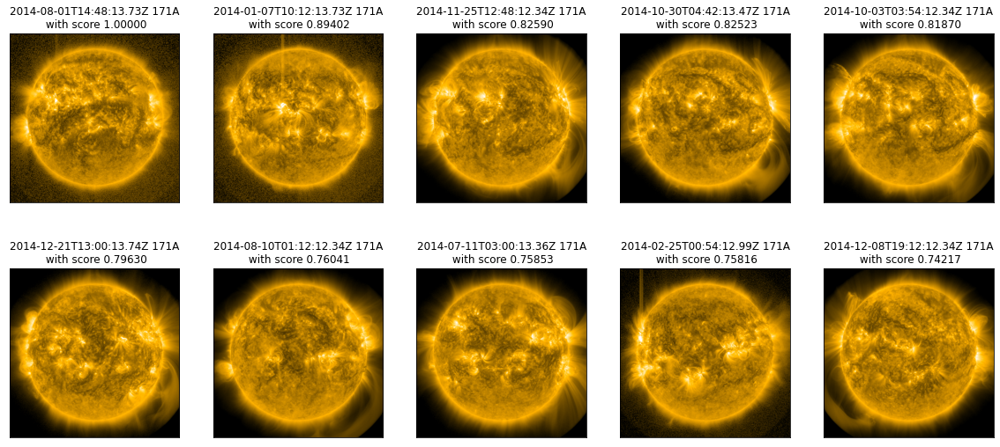

In [11]:
visualize_batch_norm(spaced_7d_top_loader, spaced_top_obs_times_7d, df)

In [70]:
from dateutil import parser
for batch_idx, samples in enumerate(spaced_7d_top_loader):
    X, y = samples
    V = {}
    for x, t_obs in zip(X, y["T_OBS"]):
        grid = make_grid(x, normalize=True, value_range=(-1.0, 1.0))
        ndarr = grid.mul(255).add_(0.5).clamp_(0, 255).permute(
                    1, 2, 0).to("cpu", torch.uint8).numpy()
        m = cm.cmlist.get('sdoaia%d' % int(171))
        v = np.squeeze(ndarr[:, :, 0])
        v = m(v)
        v = (v[:, :, :3]*255).astype(np.uint8)
        t_obs = parser.parse(t_obs).strftime(folder_time_format)
        V[t_obs] = Image.fromarray(v)
    break

In [71]:
V

{'20140107-101213': <PIL.Image.Image image mode=RGB size=512x512>,
 '20141208-191212': <PIL.Image.Image image mode=RGB size=512x512>,
 '20141221-130013': <PIL.Image.Image image mode=RGB size=512x512>,
 '20140225-005412': <PIL.Image.Image image mode=RGB size=512x512>,
 '20141125-124812': <PIL.Image.Image image mode=RGB size=512x512>,
 '20141030-044213': <PIL.Image.Image image mode=RGB size=512x512>,
 '20141003-035412': <PIL.Image.Image image mode=RGB size=512x512>,
 '20140711-030013': <PIL.Image.Image image mode=RGB size=512x512>,
 '20140801-144813': <PIL.Image.Image image mode=RGB size=512x512>,
 '20140810-011212': <PIL.Image.Image image mode=RGB size=512x512>}

In [143]:
import matplotlib.patches as mpatches
import datetime as dt
import os
from shapely.ops import unary_union
import cv2
import numpy as np
from shapely.geometry.polygon import Polygon
from datetime import datetime
from shapely import wkt
from shapely.geometry.point import Point
from shapely.geometry import Polygon
from pathlib import Path
from PIL import Image, ImageDraw

def convert_contours_to_polygons(contours, scale=1, min_width=3, min_height=3, max_width=48, max_height=48):
    polygons = []
    for cnt in contours:
        x, y, w, h = cv2.boundingRect(cnt)
        if(w < min_width or h < min_height or w > max_width or h > max_height):
            continue

        x = x * scale
        y = y * scale
        w = w * scale
        h = h * scale

        polygon = Polygon([(x, y), (x+w, y), (x+w, y+h), (x, y+h)])
        polygons.append(polygon)

    return polygons


def extract_bounding_boxes_from_anomaly_map(map_path,
                                            mode="simple",
                                            mask_threshold=20,
                                            scale=1,
                                            min_width=2,
                                            min_height=2,
                                            max_width=48,
                                            max_height=48,
                                            gaussian_filter=False,
                                            gaussian_filter_size=(5, 5)):
    """
    scale: the scale factor for bounding boxes (default 1)
    """

    pred_img = Image.open(map_path).convert("L")
    pred_img_arr = np.asarray(pred_img)

    if gaussian_filter:
        pred_img_arr = cv2.GaussianBlur(pred_img_arr, gaussian_filter_size, 0)

    if mode == "simple":
        mask_img = pred_img_arr > mask_threshold
        inverted_pred_img_arr = np.zeros_like(pred_img_arr)
        inverted_pred_img_arr[mask_img] = pred_img_arr[mask_img]
        mask_img = inverted_pred_img_arr
    elif mode == "binary":
        ret, mask_img = cv2.threshold(
            pred_img_arr, mask_threshold, 255, cv2.THRESH_BINARY)
    elif mode == "otsu":
        ret, mask_img = cv2.threshold(
            pred_img_arr, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    else:
        raise f"thresholding method {mode} not recognized"

    contours, hierarchy = cv2.findContours(
        mask_img, cv2.RETR_LIST, cv2.CHAIN_APPROX_TC89_KCOS)
    model_polygons = convert_contours_to_polygons(
        contours, scale=scale, min_width=min_width, min_height=min_height, max_width=max_width, max_height=max_height)

    return pred_img, model_polygons


def show_box_img(img, src_img, anomaly_bboxes, aia_wave=171, title=""):
    plt.clf()
    pred_img_arr = np.asarray(img)
    pred_img_arr = np.invert(pred_img_arr)
    img = Image.fromarray(pred_img_arr)
    img = img.convert('RGB')
    img_draw = ImageDraw.Draw(img)
    fig = plt.figure()
    
    f, axarr = plt.subplots(1,2, figsize=(22, 10)) #

    for poly in anomaly_bboxes:
        poly = poly.exterior.coords
        img_draw.line(poly, fill="red", width=1)

    red_patch = mpatches.Patch(color='red', label='ceVAE bounding box')
    axarr[0].imshow(src_img)
    axarr[0].set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])
    #axarr[1].legend(handles=[red_patch])
    axarr[1].imshow(img)
    
    plt.suptitle(title, fontsize="20")
    
    plt.axis('off')
    
    
def display_boxes(map_path):
    t_obs = map_path.name.split("_")[0]
    src_img = V[t_obs]
    img, anomaly_boxes = extract_bounding_boxes_from_anomaly_map(
        map_path, mode="otsu", scale=1, gaussian_filter=True)
    
    t_obs = datetime.strptime(t_obs, folder_time_format)
    show_box_img(img, src_img, anomaly_boxes, title=f"{t_obs} 171A")

In [144]:
%config InlineBackend.figure_format = 'retina'
aia_wave = "171A"
pixel_pred_paths = list(Path(pixel_pred_path).glob(f'*_{aia_wave}.png'))

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

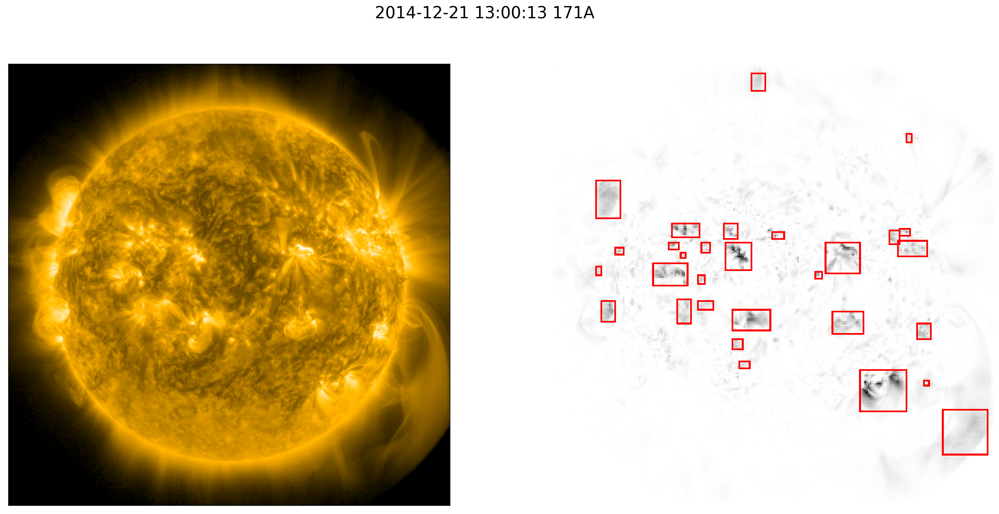

In [145]:
display_boxes(pixel_pred_paths[0])

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

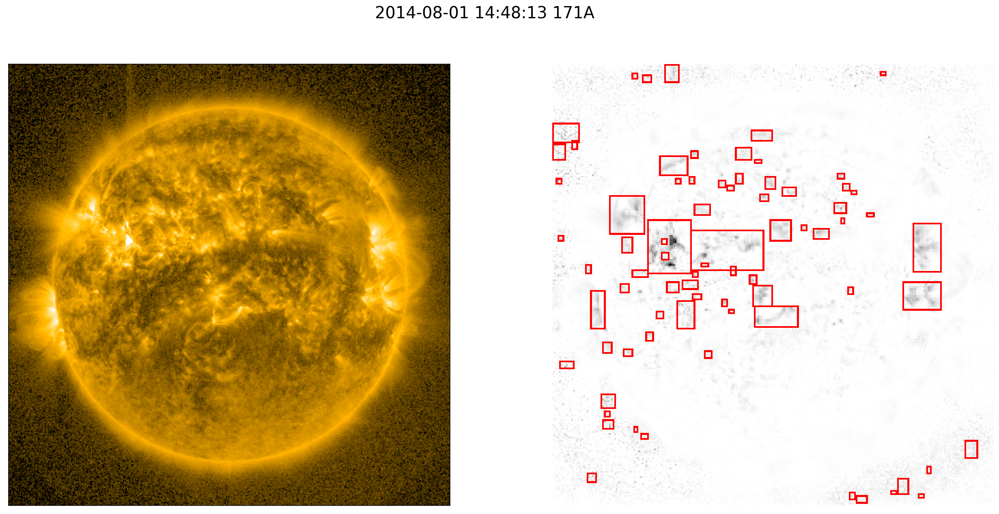

In [146]:
display_boxes(pixel_pred_paths[1])

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

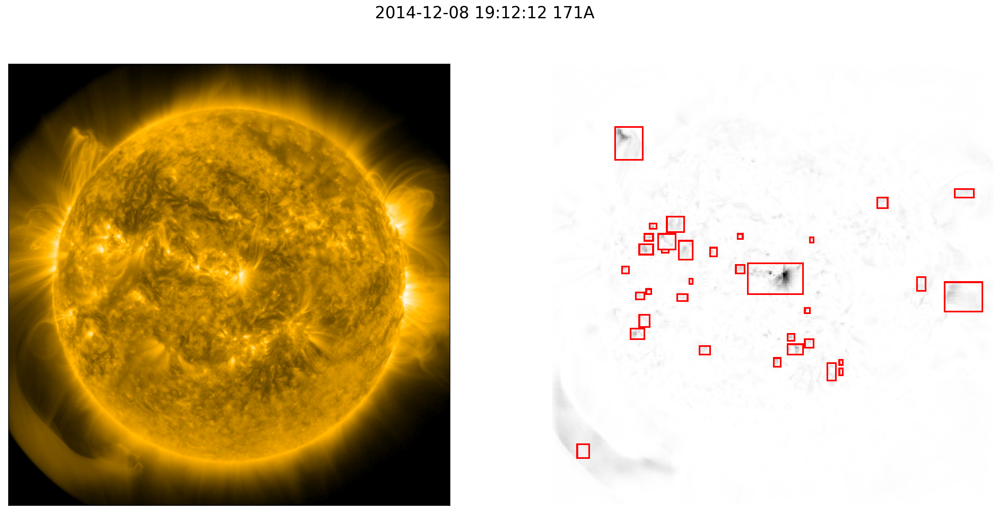

In [147]:
display_boxes(pixel_pred_paths[2])

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

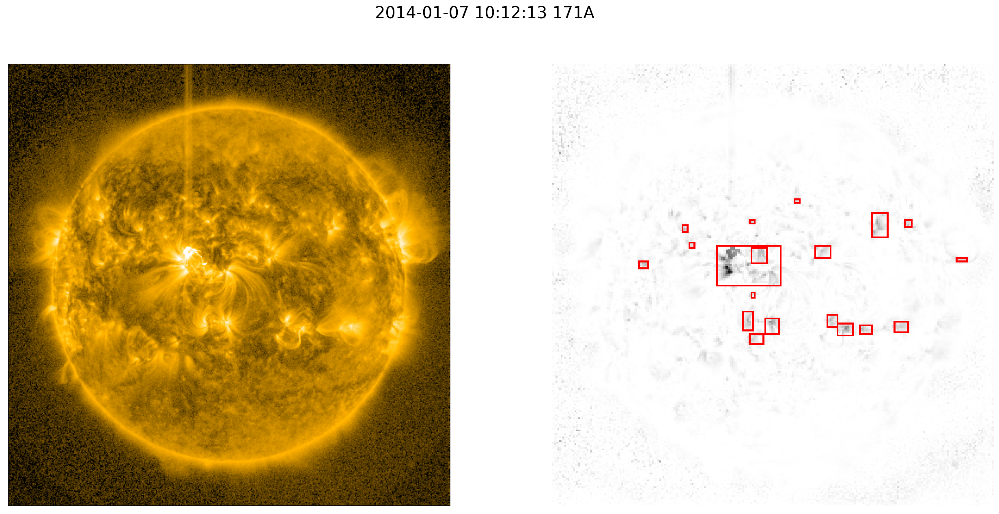

In [148]:
display_boxes(pixel_pred_paths[3])

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

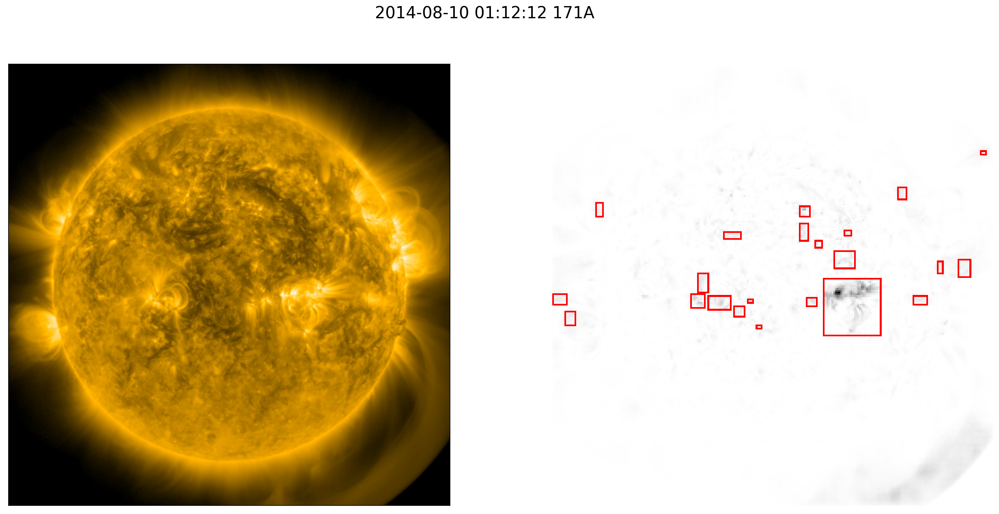

In [149]:
display_boxes(pixel_pred_paths[4])

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

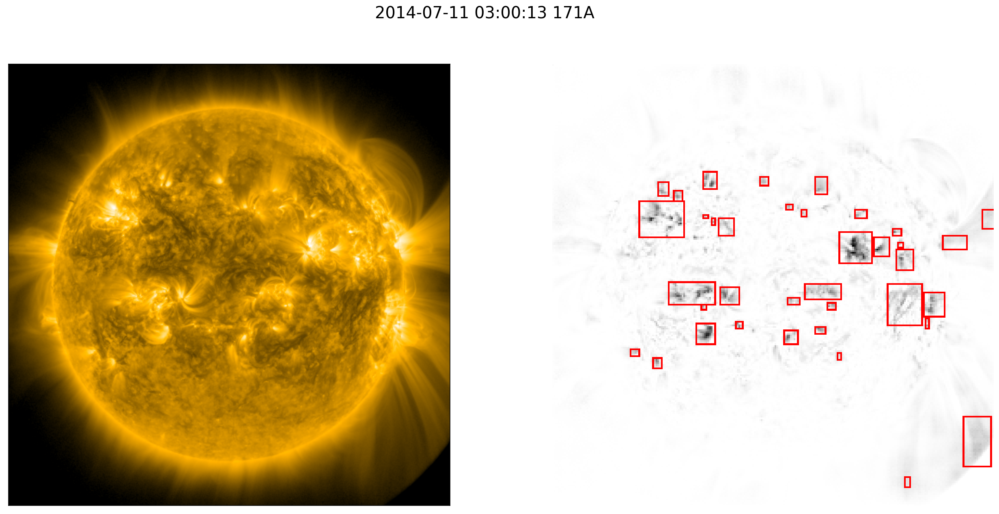

In [150]:
display_boxes(pixel_pred_paths[5])

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

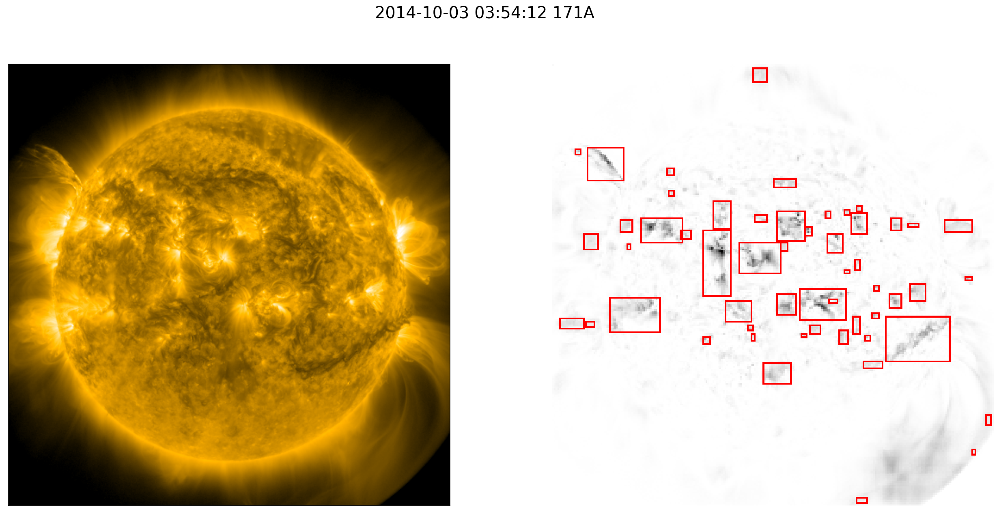

In [151]:
display_boxes(pixel_pred_paths[6])

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

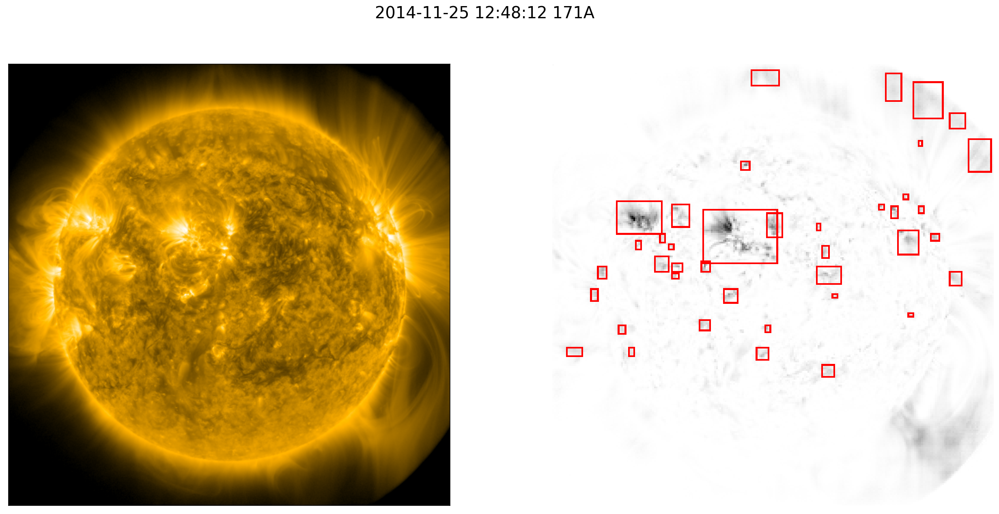

In [152]:
display_boxes(pixel_pred_paths[7])

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

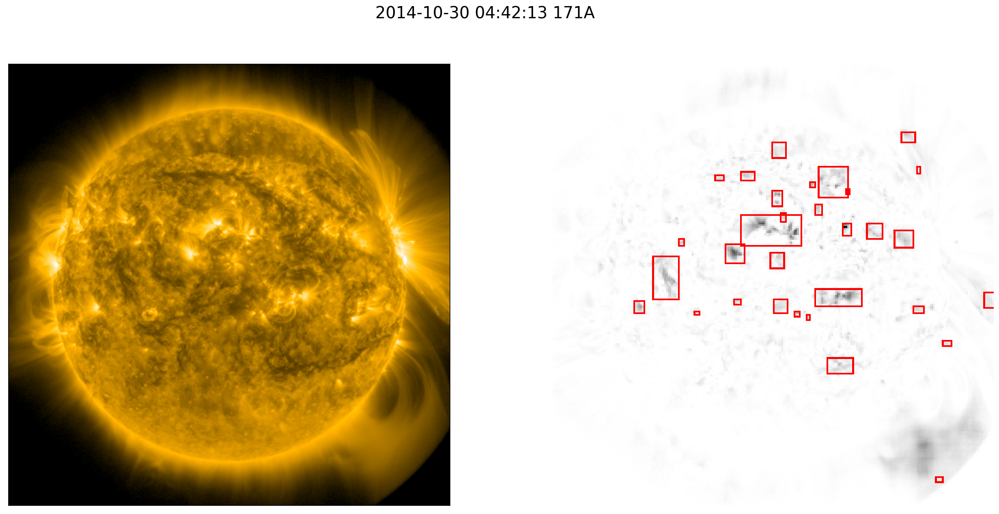

In [153]:
display_boxes(pixel_pred_paths[8])

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

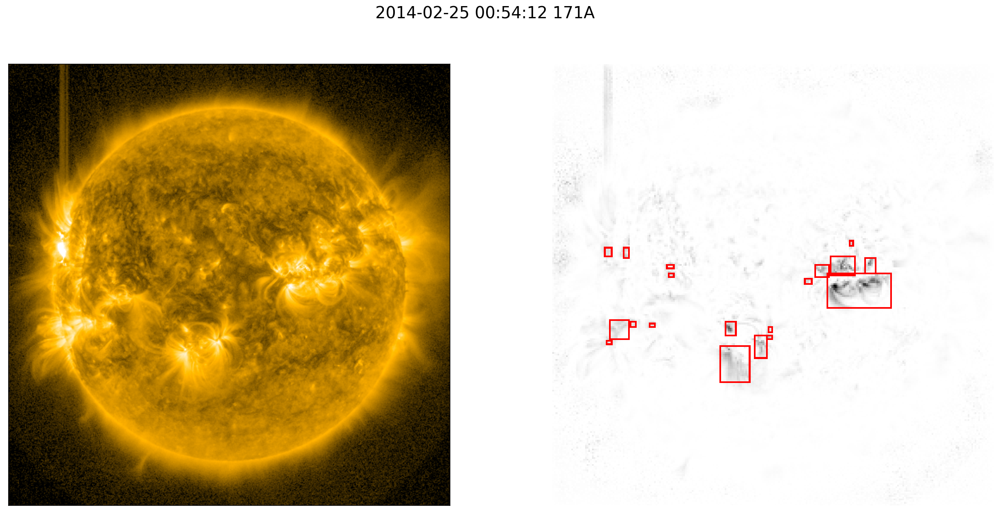

In [154]:
display_boxes(pixel_pred_paths[9])